# Case Study-Forecasting Bus Demand in Banana Municipalities For a Week


The task is to forecast the hourly bus usage for the next week for each municipality in Banana Republic, based on the given dataset. The dataset includes two measurements per hour for each municipality, along with the timestamp, usage, and total capacity. The goal is to aggregate the two measurements per hour by taking the maximum value and model this data using a time series model.

To begin with, a simple baseline model should be implemented, followed by more complex methods to improve the accuracy. The committee will use the last two weeks of the dataset (starting from 2017-08-05 to 2017-08-19) as assessment (test) data. The code should report the error for the last two weeks. True values can be used to predict the last week of test data, and the error of the first and last week of the test should be combined separately.

It should be noted that the dataset has missing data, so a suitable missing data interpolation method should be used.

In this step, we import all the necessary libraries required for data processing, visualization, and modeling.

In [103]:
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import random
from keras.layers import LSTM, Dense, Dropout
from keras import regularizers


In [68]:
# Load the dataset
df = pd.read_csv('https://pi.works/3w8IJbV')
df.columns = ['Timestamp', 'Municipality_ID', 'Usage', 'Total_Capacity']
df.head()

,Timestamp,Municipality_ID,Usage,Total_Capacity
0,2017-06-04 07:59:42,9,454,1332
1,2017-06-04 07:59:42,8,556,2947
2,2017-06-04 07:59:42,4,1090,3893
3,2017-06-04 07:59:42,0,204,2813
4,2017-06-04 07:59:42,7,718,2019


In [32]:
num_null_first = df.isnull().sum()
num_null_first

Timestamp          0
Municipality_ID    0
Usage              0
Total_Capacity     0
dtype: int64

In [34]:
# data types as result
datatypes_originally = df.dtypes
  
# Print the data types of each column
datatypes_originally

Timestamp          object
Municipality_ID     int64
Usage               int64
Total_Capacity      int64
dtype: object

In [69]:
# Convert the Timestamp column to a datetime object
df['Timestamp'] = pd.to_datetime(df['Timestamp'])

In [61]:
# data types as result
datatypes_convert = df.dtypes
  
# Print the data types of each column
datatypes_convert

Timestamp          datetime64[ns]
Municipality_ID             int64
Usage                       int64
Total_Capacity              int64
dtype: object

In [70]:
hour = df['Hour'] = df['Timestamp'].dt.hour
#minute = df['minute'] = df['timestamp'].dt.minute
time = df['Time'] = df['Timestamp'].dt.date

# Convert the Timestamp column to a datetime object
df['Time'] = pd.to_datetime(df['Time'])

In [71]:
# Group the dataframe by hour and take the max usage value
df_hourly_max = df.groupby([pd.Grouper(key='Timestamp', freq='H'),'Time','Hour','Municipality_ID','Total_Capacity'], as_index=False)['Usage'].max()

# Display the resulting dataframe
df_hourly_max.head()


,Time,Hour,Municipality_ID,Total_Capacity,Usage
0,2017-06-04,7,0,2813,204
1,2017-06-04,7,1,397,129
2,2017-06-04,7,2,697,273
3,2017-06-04,7,3,1930,623
4,2017-06-04,7,4,3893,1090


In [40]:
num_null = df_hourly_max.isnull().sum()
print("Number of empty values in Usage column:", num_null)

# Print the summary info of the dataframe
print(df_hourly_max.info())

# Print the average, minimum and maximum of the 'Usage' column
print("Average usage: ", df_hourly_max['Usage'].mean())
print("Minimum usage: ", df_hourly_max['Usage'].min())
print("Maximum usage: ", df_hourly_max['Usage'].max())


Number of empty values in Usage column: Time               0
Hour               0
Municipality_ID    0
Total_Capacity     0
Usage              0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6740 entries, 0 to 6739
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Time             6740 non-null   datetime64[ns]
 1   Hour             6740 non-null   int64         
 2   Municipality_ID  6740 non-null   int64         
 3   Total_Capacity   6740 non-null   int64         
 4   Usage            6740 non-null   int64         
dtypes: datetime64[ns](1), int64(4)
memory usage: 263.4 KB
None
Average usage:  893.3216617210683
Minimum usage:  12
Maximum usage:  3508


In [72]:
start_date = pd.to_datetime('2017-08-05')
end_date = pd.to_datetime('2017-08-19')

test_data = df_hourly_max[(df_hourly_max['Time'] >= start_date) & (df_hourly_max['Time'] <= end_date)]
train_data = df_hourly_max[df_hourly_max['Time'] < start_date]
test_data = test_data.reset_index(drop=True)

In [68]:
train_data

,Time,Hour,Municipality_ID,Total_Capacity,Usage
0,2017-06-04,7,0,2813,204
1,2017-06-04,7,1,397,129
2,2017-06-04,7,2,697,273
3,2017-06-04,7,3,1930,623
4,2017-06-04,7,4,3893,1090
...,...,...,...,...,...
5315,2017-08-02,16,5,587,114
5316,2017-08-02,16,6,3113,1018
5317,2017-08-02,16,7,2019,1169
5318,2017-08-02,16,8,2947,1035


In [43]:
test_data

,Time,Hour,Municipality_ID,Total_Capacity,Usage
0,2017-08-05,8,0,2813,252
1,2017-08-05,8,1,397,158
2,2017-08-05,8,2,697,327
3,2017-08-05,8,3,1930,781
4,2017-08-05,8,4,3893,2132
...,...,...,...,...,...
1415,2017-08-19,16,5,587,239
1416,2017-08-19,16,6,3113,1727
1417,2017-08-19,16,7,2019,1450
1418,2017-08-19,16,8,2947,1253


In [80]:
train_data['Datetime'] = pd.to_datetime(train_data['Time'].dt.strftime('%Y-%m-%d') + ' ' + train_data['Hour'].astype(str) + ':00:00')
test_data['Datetime'] = pd.to_datetime(test_data['Time'].dt.strftime('%Y-%m-%d') + ' ' + test_data['Hour'].astype(str) + ':00:00')

C:\Users\bugra\AppData\Local\Temp\ipykernel_31168\409188261.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data['Datetime'] = pd.to_datetime(train_data['Time'].dt.strftime('%Y-%m-%d') + ' ' + train_data['Hour'].astype(str) + ':00:00')


In [122]:
# Set up the train and test datasets
train_datas = train_data.copy()
test_datas = test_data.copy()

# Group the train and test datasets by Municipality_ID
train_datasets = [train_datas[train_datas['Municipality_ID'] == i].reset_index(drop=True) for i in range(10)]
test_datasets = [test_datas[test_datas['Municipality_ID'] == i].reset_index(drop=True) for i in range(10)]
test_datasets

[          Time  Hour  Municipality_ID  Total_Capacity  Usage  \
 0   2017-08-05     8                0            2813    252   
 1   2017-08-05     9                0            2813    393   
 2   2017-08-05    10                0            2813    517   
 3   2017-08-05    11                0            2813    653   
 4   2017-08-05    12                0            2813    655   
 ..         ...   ...              ...             ...    ...   
 137 2017-08-19    12                0            2813   1281   
 138 2017-08-19    13                0            2813   1283   
 139 2017-08-19    14                0            2813   1285   
 140 2017-08-19    15                0            2813   1286   
 141 2017-08-19    16                0            2813   1276   
 
                Datetime  
 0   2017-08-05 08:00:00  
 1   2017-08-05 09:00:00  
 2   2017-08-05 10:00:00  
 3   2017-08-05 11:00:00  
 4   2017-08-05 12:00:00  
 ..                  ...  
 137 2017-08-19 12:00:00  
 1

## Forecasting with ExponentialSmoothing algorithm

RMSE for Municipality 0: 340.9772


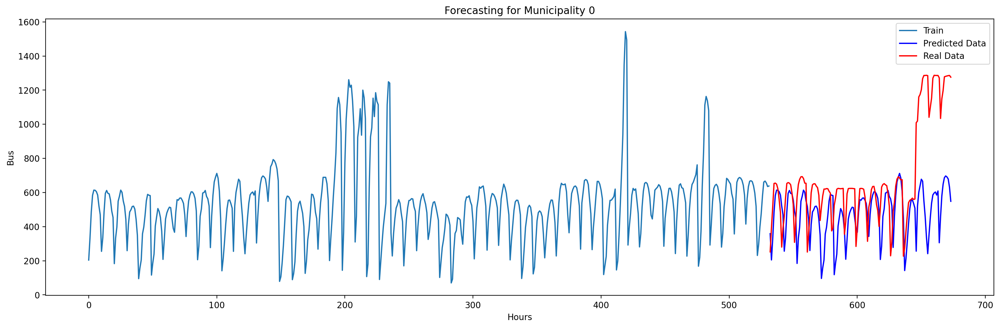

RMSE for Municipality 1: 120.5679


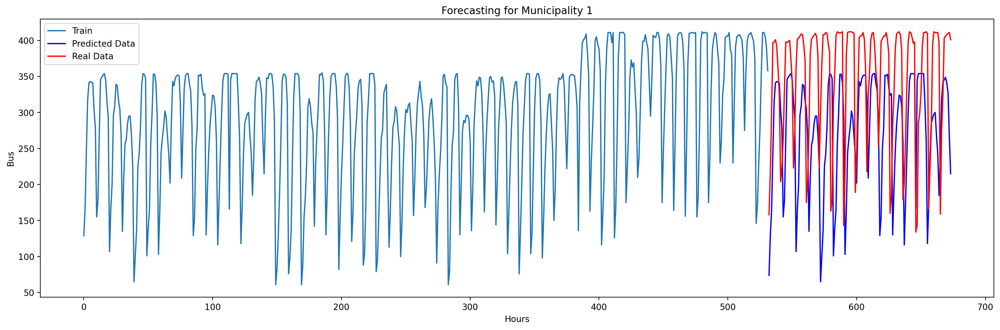

RMSE for Municipality 2: 132.9360


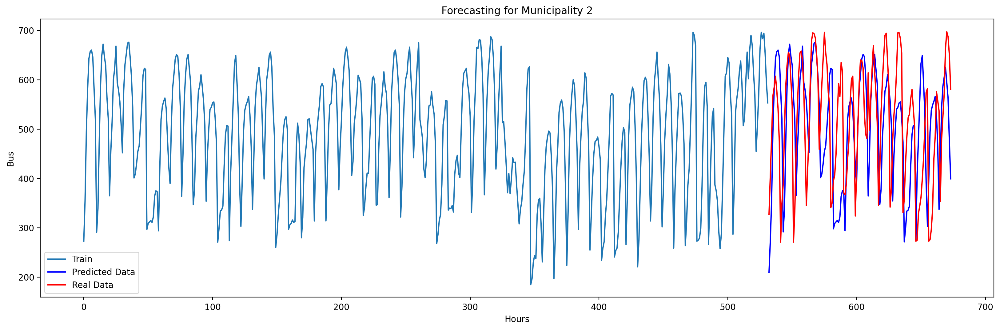

RMSE for Municipality 3: 402.2167


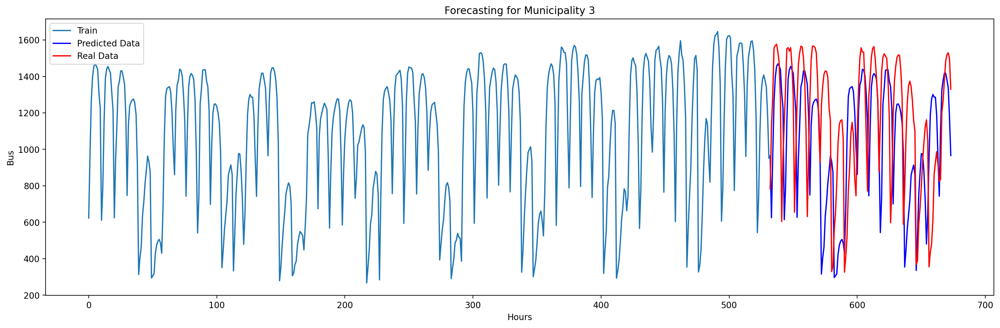

RMSE for Municipality 4: 976.2654


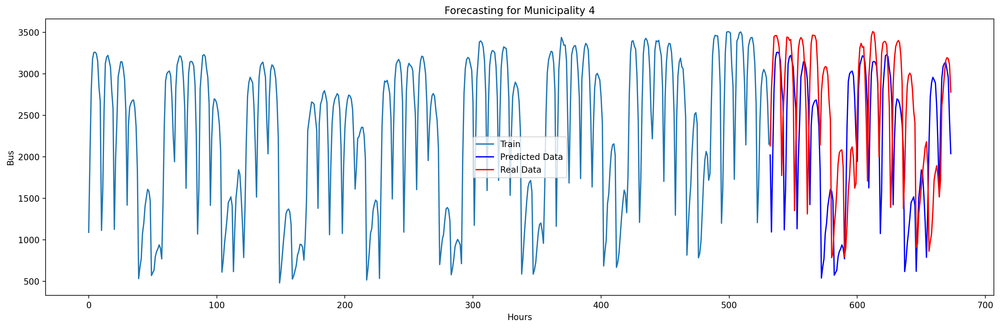

RMSE for Municipality 5: 123.4987


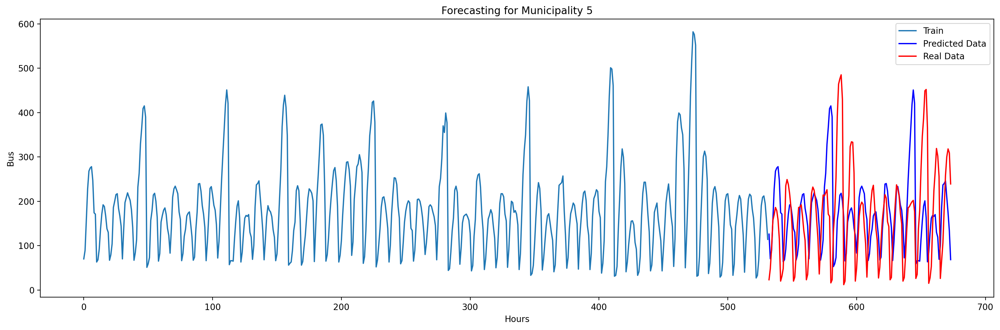

RMSE for Municipality 6: 323.8531


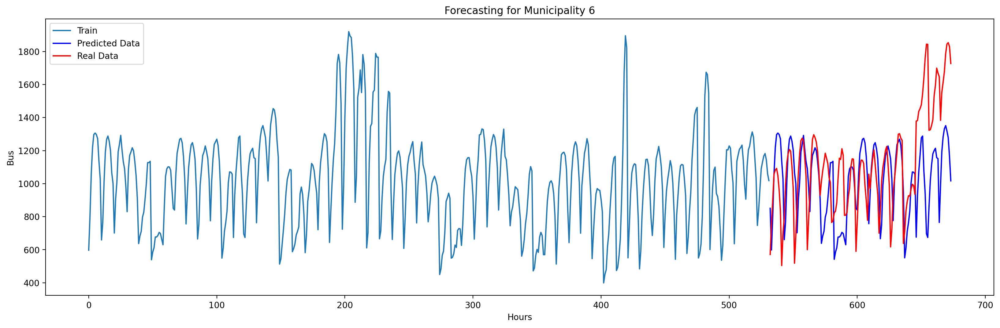

RMSE for Municipality 7: 320.4777


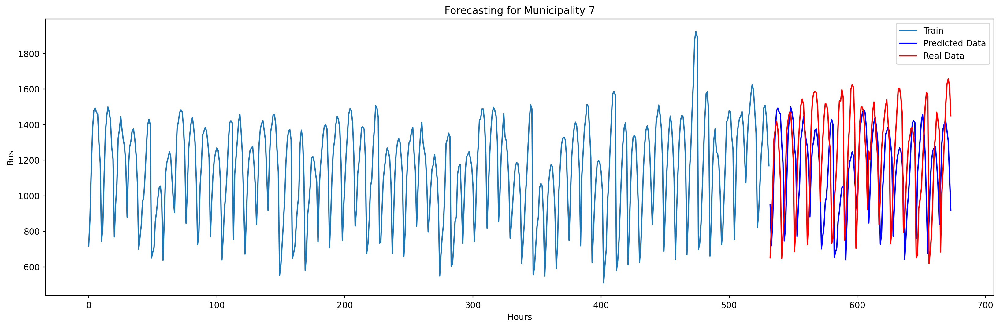

RMSE for Municipality 8: 333.1266


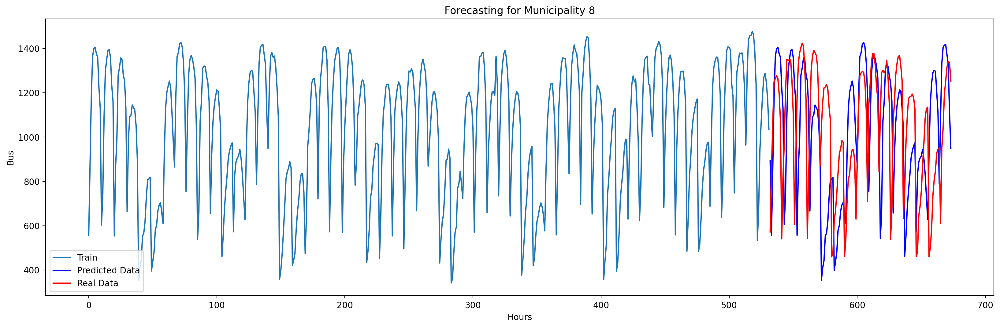

RMSE for Municipality 9: 208.3095


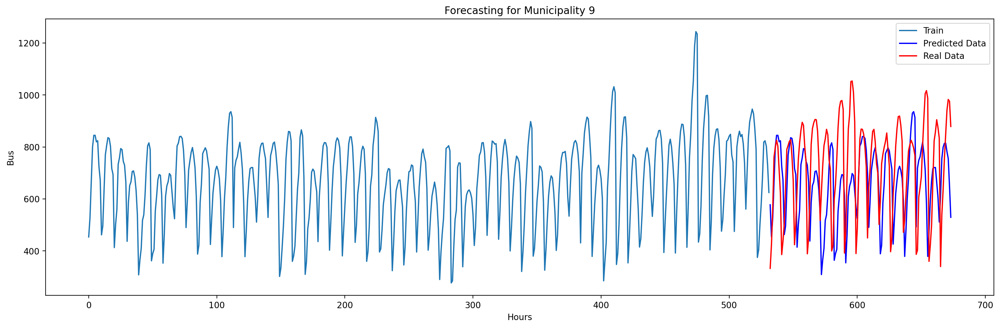

RMSE values for all municipalities: [340.97721505681676, 120.56794295216449, 132.93595926380974, 402.21667328066627, 976.2654106591327, 123.49870612357421, 323.85314103937264, 320.47765785265454, 333.1265587085404, 208.3094755381753]


In [123]:
# Initialize a list to store the RMSE values
rmse_values_ES = []

# Set up the train and test datasets
train_datas = train_data.copy()
test_datas = test_data.copy()

# Group the train and test datasets by Municipality_ID
train_datasets = [train_datas[train_datas['Municipality_ID'] == i].reset_index(drop=True) for i in range(10)]
test_datasets = [test_datas[test_datas['Municipality_ID'] == i].reset_index(drop=True) for i in range(10)]

# Loop through each train and test dataset and fit the ExponentialSmoothing model, make predictions, and plot the results
for i in range(10):
    # Fit the model on the train dataset
    model = ExponentialSmoothing(train_datasets[i]['Usage'], trend=None, seasonal=None, seasonal_periods=None)
    hw_model = model.fit(optimized=True, remove_bias=False)
    
    # Make predictions on the test dataset
    predictions = hw_model.predict(start=test_datasets[i]['Usage'].index[0], end=test_datasets[i]['Usage'].index[-1])
    predictions.index += len(train_datasets[i])
    test_datasets[i].index += len(train_datasets[i])

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(test_datasets[i]["Usage"], predictions))
    rmse_values_ES.append(rmse)
    print(f"RMSE for Municipality {i}: {rmse:.4f}")
    
    # Plot the actual vs. predicted values
    plt.figure(figsize=(20, 6), dpi=200)
    plt.plot(train_datasets[i]["Usage"].index, train_datasets[i]["Usage"], label='Train')
    plt.plot(predictions.index, predictions, 'b-', label = 'Predicted Data')
    plt.plot(test_datasets[i]["Usage"].index, test_datasets[i]["Usage"], 'r-', label = 'Real Data')
    plt.xlabel('Hours')
    plt.ylabel('Bus')
    plt.title(f'Forecasting for Municipality {i}')
    plt.legend(loc="best")
    plt.show()

# Print the list of RMSE values for all municipalities
print("RMSE values for all municipalities:", rmse_values_ES)


## Grid Search for Timestep

In [87]:
from sklearn.model_selection import GridSearchCV

# Set the random seeds for reproducibility
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

# Define a function for creating and training the LSTM model
def create_and_train_model(time_steps):
    model = Sequential()
    model.add(LSTM(64, activation='relu', input_shape=(time_steps, 2)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=50, verbose=0)
    return model

# Define the range of time_steps values to try
time_steps_range = [5, 10, 15, 24, 48, 72, 96]  # Example values, adjust as needed


# Perform grid search
best_time_steps = None
best_rmse = float('inf')

for time_steps in time_steps_range:
    # Normalize the data
    scaler = MinMaxScaler()
    train_datasets[i][['Usage', 'Total_Capacity']] = scaler.fit_transform(train_datasets[i][['Usage', 'Total_Capacity']])
    test_datasets[i][['Usage', 'Total_Capacity']] = scaler.transform(test_datasets[i][['Usage', 'Total_Capacity']])
    # Prepare the input and output data
    X_train, y_train = create_dataset(train_datasets[i][['Usage', 'Total_Capacity']], train_datasets[i]['Usage'], time_steps)

    # Create and train the model
    model = create_and_train_model(time_steps)

    # Make predictions on the test set
    X_test, y_test = create_dataset(test_datasets[i][['Usage', 'Total_Capacity']], test_datasets[i]['Usage'], time_steps)
    y_pred = model.predict(X_test)

    # Rescale the predicted and actual usage data back to their original scale
    y_test_rescaled = scaler.inverse_transform(np.hstack([y_test.reshape(-1, 1), np.zeros_like(y_test.reshape(-1, 1))]))[:, 0]
    y_pred_rescaled = scaler.inverse_transform(np.hstack([y_pred, np.zeros_like(y_pred)]))[:, 0]

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_rescaled, y_pred_rescaled))

    # Check if this time_steps value is the best so far
    if rmse < best_rmse:
        best_rmse = rmse
        best_time_steps = time_steps

print("Best time_steps:", best_time_steps)


2/2 [==============================] - 0s 57ms/step
Best time_steps: 24


## Forecasting with CNN algorithm

4/4 [==============================] - 0s 4ms/step
RMSE for Municipality 0: 134.5967


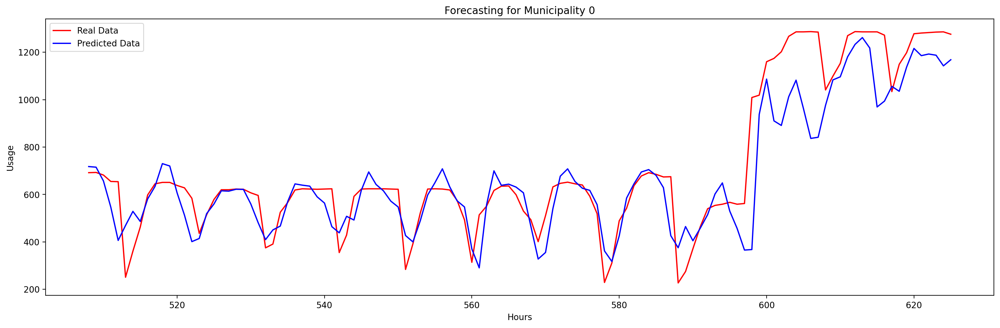

4/4 [==============================] - 0s 6ms/step
RMSE for Municipality 1: 49.8760


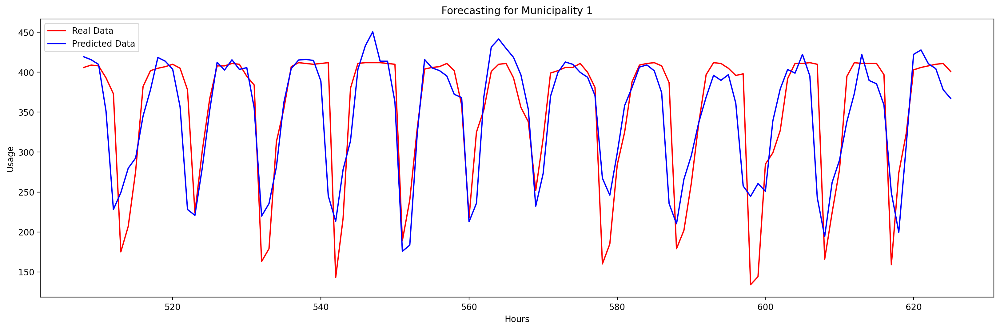

4/4 [==============================] - 0s 13ms/step
RMSE for Municipality 2: 65.9495


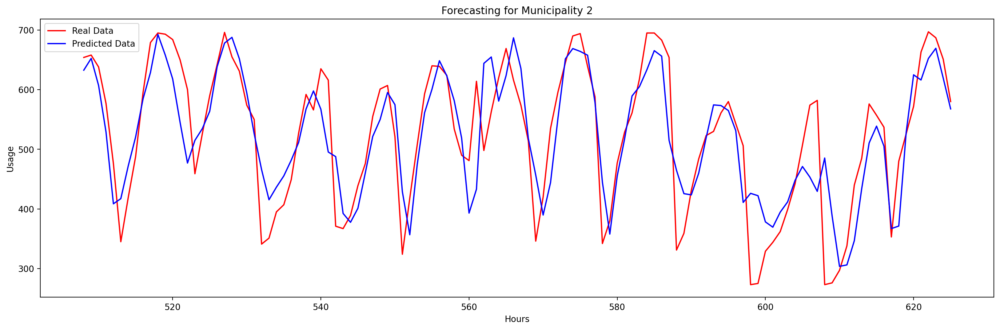

4/4 [==============================] - 0s 8ms/step
RMSE for Municipality 3: 149.5992


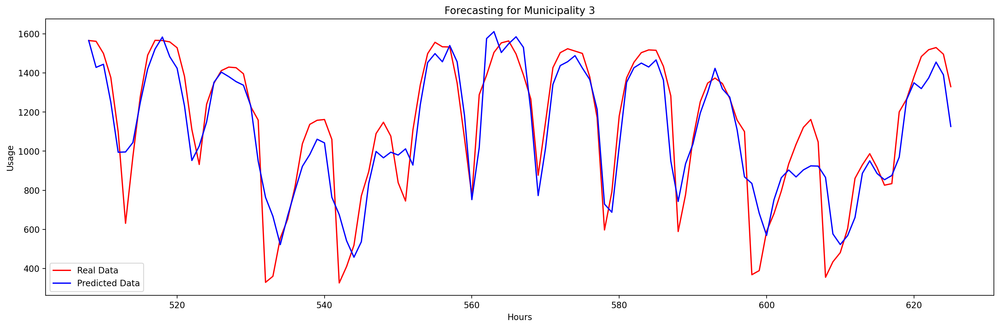

4/4 [==============================] - 0s 7ms/step
RMSE for Municipality 4: 314.5714


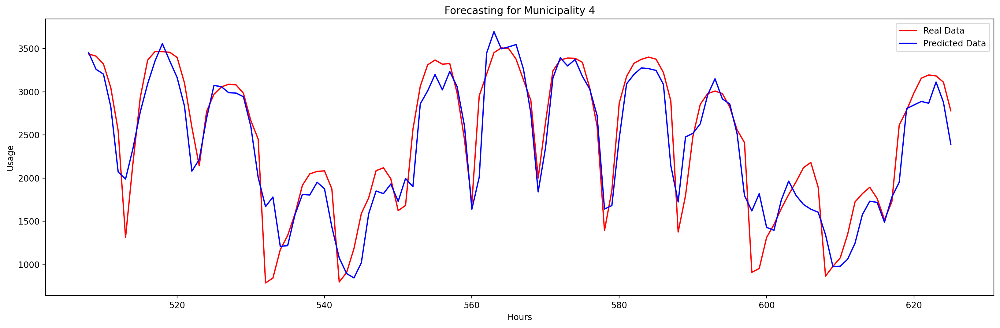

4/4 [==============================] - 0s 12ms/step
RMSE for Municipality 5: 41.2196


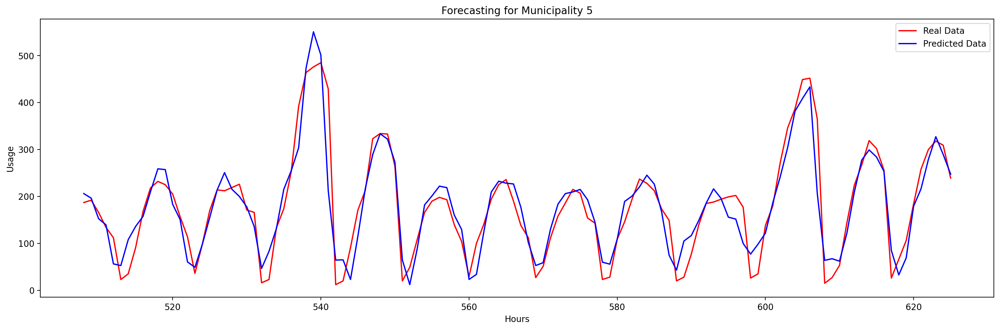

4/4 [==============================] - 0s 10ms/step
RMSE for Municipality 6: 139.5230


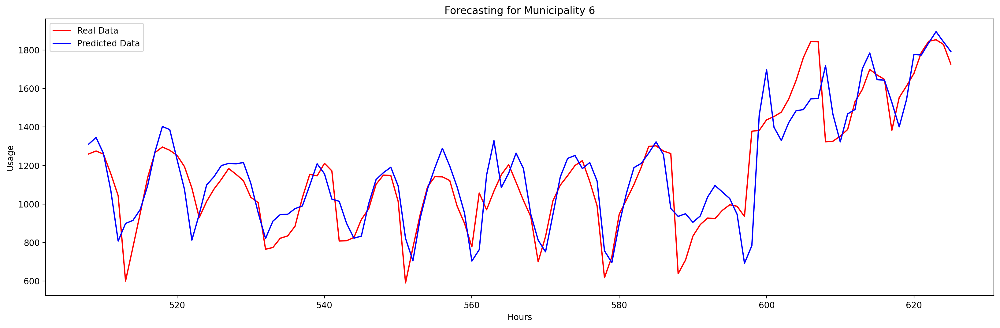

4/4 [==============================] - 0s 5ms/step
RMSE for Municipality 7: 137.7582


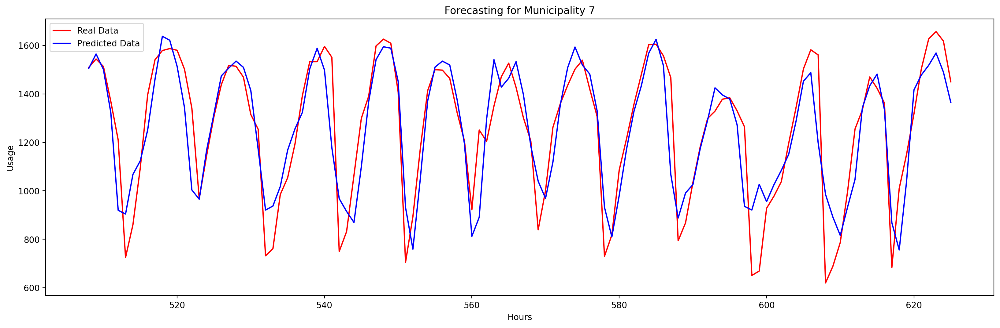

4/4 [==============================] - 0s 10ms/step
RMSE for Municipality 8: 135.7533


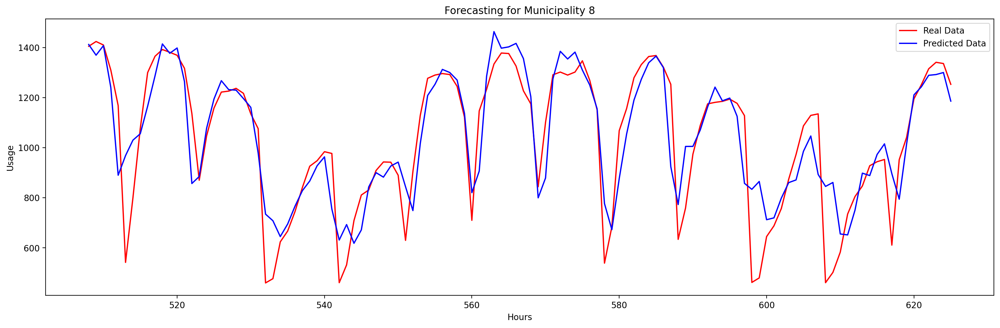

4/4 [==============================] - 0s 5ms/step
RMSE for Municipality 9: 85.8587


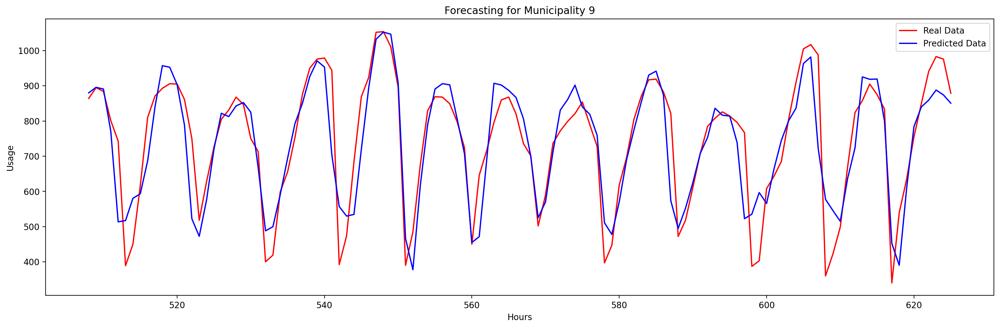

RMSE values for all municipalities: [134.59666988668926, 49.87601996145026, 65.949514614627, 149.59922697753294, 314.57144679880656, 41.21958623105592, 139.52300866365212, 137.75823103313851, 135.75325525920124, 85.85867592119905]


In [97]:
# Set the random seeds for reproducibility
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

# Initialize a list to store the RMSE values
rmse_values_CNN = []
time_steps=24

# Loop through each train and test dataset and fit the 1D CNN model, make predictions, and plot the results
for i in range(10):
    # Normalize the data
    scaler = MinMaxScaler()
    train_datasets[i][['Usage', 'Total_Capacity']] = scaler.fit_transform(train_datasets[i][['Usage', 'Total_Capacity']])
    test_datasets[i][['Usage', 'Total_Capacity']] = scaler.transform(test_datasets[i][['Usage', 'Total_Capacity']])
    
    # Prepare the input and output data
    X_train, y_train = create_dataset(train_datasets[i][['Usage', 'Total_Capacity']], train_datasets[i]['Usage'], time_steps)
    X_test, y_test = create_dataset(test_datasets[i][['Usage', 'Total_Capacity']], test_datasets[i]['Usage'], time_steps)

    # Build the 1D CNN model
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(time_steps, 2)))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(50, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')

    # Train the model
    model.fit(X_train, y_train, epochs=50, verbose=0)

    # Make predictions
    y_pred = model.predict(X_test)

    # Rescale the predicted and actual usage data back to their original scale
    y_test_rescaled = scaler.inverse_transform(np.hstack([y_test.reshape(-1, 1), np.zeros_like(y_test.reshape(-1, 1))]))[:, 0]
    y_pred_rescaled = scaler.inverse_transform(np.hstack([y_pred, np.zeros_like(y_pred)]))[:, 0]

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_rescaled, y_pred_rescaled))
    rmse_values_CNN.append(rmse)

    # Print the RMSE for the current municipality
    print(f"RMSE for Municipality {i}: {rmse:.4f}")

    # Plot the actual vs. predicted values
    plt.figure(figsize=(20, 6), dpi=200)
    plt.plot(np.arange(len(y_train), len(y_train) + len(y_test)), y_test_rescaled, 'r-', label='Real Data')
    plt.plot(np.arange(len(y_train), len(y_train) + len(y_pred)), y_pred_rescaled, 'b-', label='Predicted Data')
    plt.xlabel('Hours')
    plt.ylabel('Usage')
    plt.title(f'Forecasting for Municipality {i}')
    plt.legend(loc="best")
    plt.show()

# Print the list of RMSE values for all municipalities
print("RMSE values for all municipalities:", rmse_values_CNN)


4/4 [==============================] - 1s 13ms/step
RMSE for Municipality 0: 132.5328


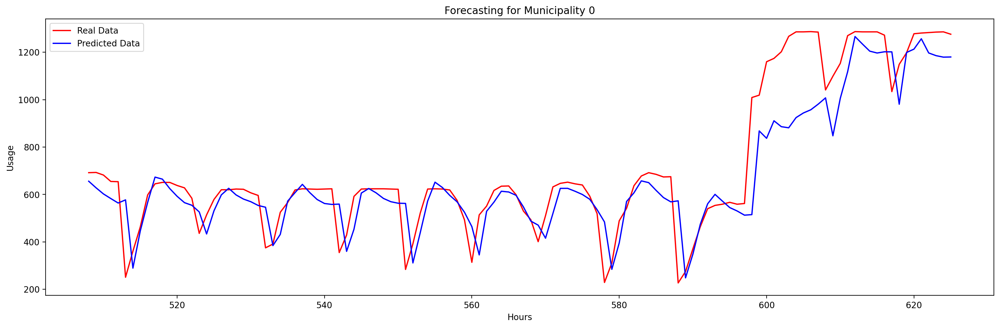

4/4 [==============================] - 0s 11ms/step
RMSE for Municipality 1: 51.1178


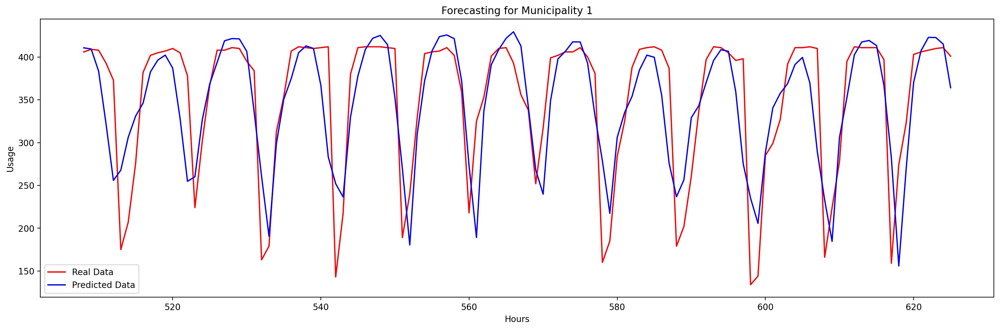

4/4 [==============================] - 0s 13ms/step
RMSE for Municipality 2: 68.6517


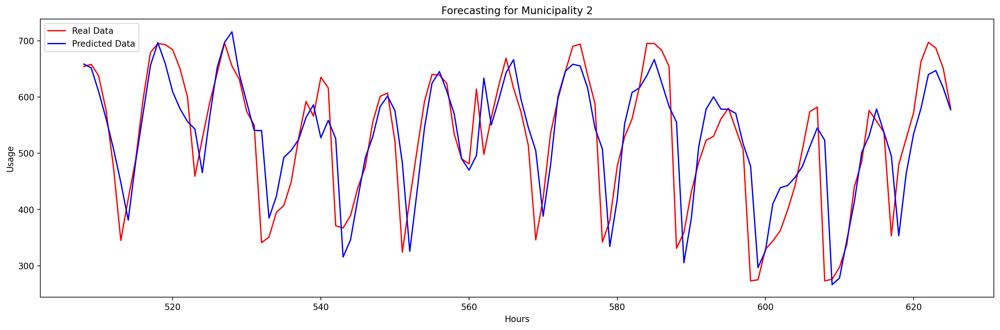

4/4 [==============================] - 0s 16ms/step
RMSE for Municipality 3: 196.1672


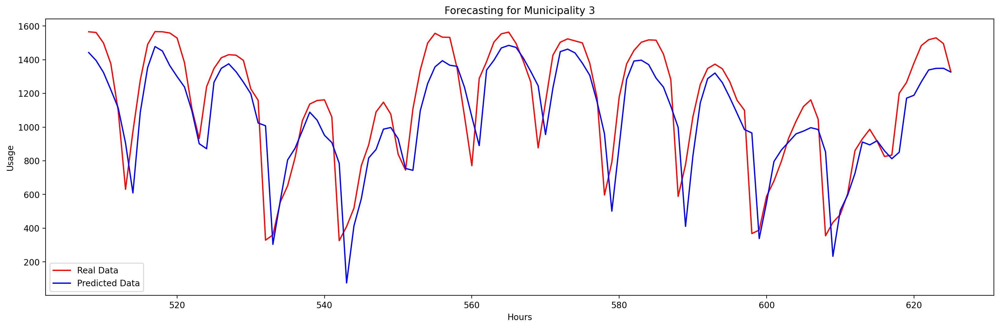

4/4 [==============================] - 0s 5ms/step
RMSE for Municipality 4: 438.0063


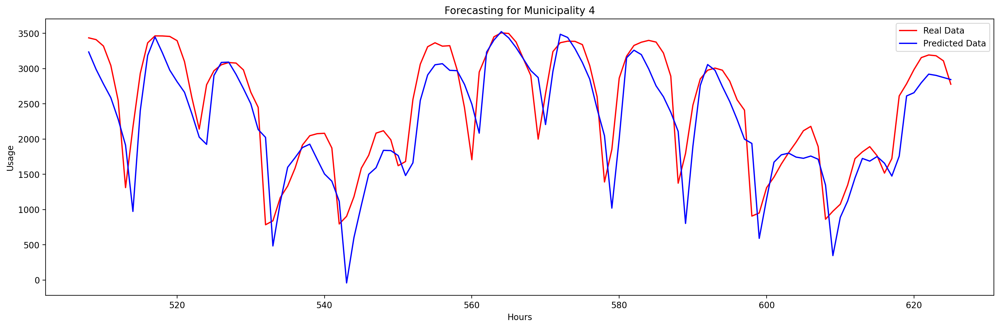

4/4 [==============================] - 0s 6ms/step
RMSE for Municipality 5: 56.4466


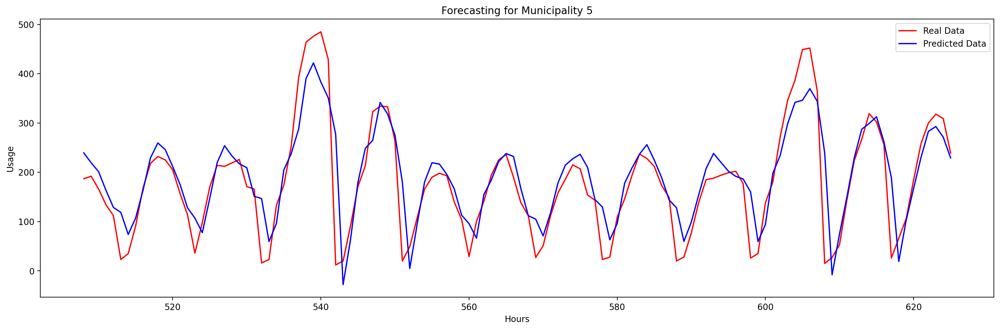

4/4 [==============================] - 0s 18ms/step
RMSE for Municipality 6: 136.3428


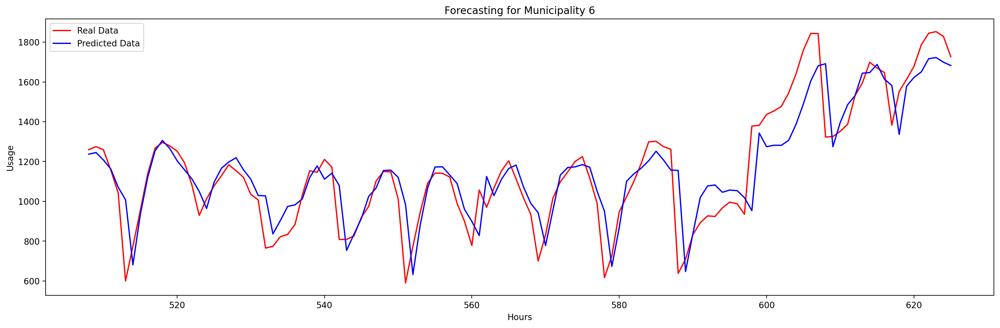

4/4 [==============================] - 1s 11ms/step
RMSE for Municipality 7: 156.0054


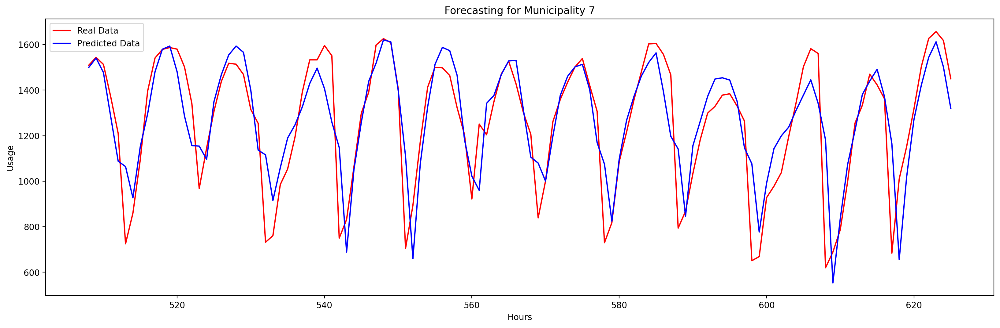

4/4 [==============================] - 1s 14ms/step
RMSE for Municipality 8: 167.8005


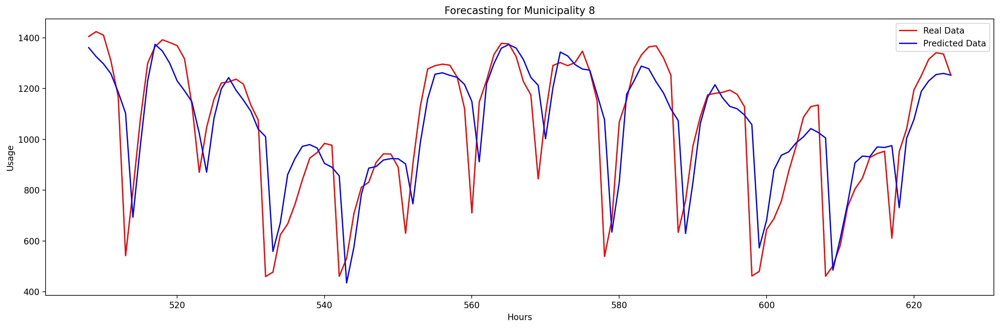

4/4 [==============================] - 0s 16ms/step
RMSE for Municipality 9: 98.1688


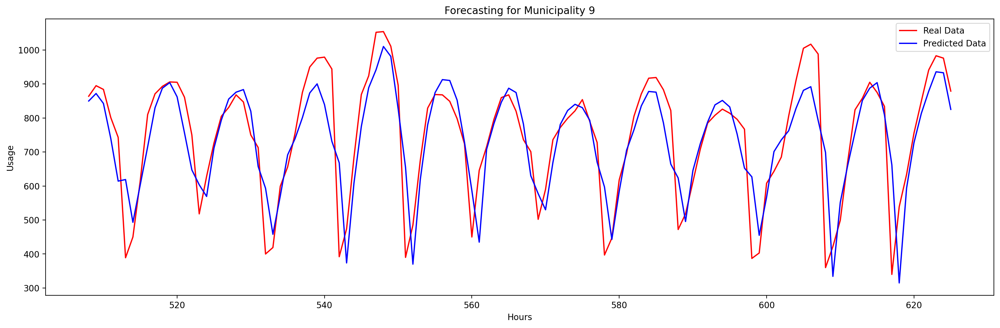

RMSE values for all municipalities: [132.53284410178168, 51.117809838801385, 68.6517300409506, 196.16715499402696, 438.00629943809935, 56.44660719544155, 136.34278046197514, 156.00536944409464, 167.80048381946526, 98.16875541848187]


In [99]:
# Set the random seeds for reproducibility
random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)


def create_dataset(X, y, time_steps):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        v = X.iloc[i:(i + time_steps)].values
        Xs.append(v)
        ys.append(y.iloc[i + time_steps])
    return np.array(Xs), np.array(ys)

time_steps=24

# Initialize a list to store the RMSE values
rmse_values_LSTM = []

for i in range(10):
    # Normalize the data
    scaler = MinMaxScaler()
    train_datasets[i][['Usage', 'Total_Capacity']] = scaler.fit_transform(train_datasets[i][['Usage', 'Total_Capacity']])
    test_datasets[i][['Usage', 'Total_Capacity']] = scaler.transform(test_datasets[i][['Usage', 'Total_Capacity']])
    
    # Prepare the input and output data
    X_train, y_train = create_dataset(train_datasets[i][['Usage', 'Total_Capacity']], train_datasets[i]['Usage'], time_steps)
    X_test, y_test = create_dataset(test_datasets[i][['Usage', 'Total_Capacity']], test_datasets[i]['Usage'], time_steps)


    # Build the LSTM model
    model = Sequential()
    model.add(LSTM(64, activation='relu', input_shape=(time_steps, 2)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')

    # Train the model
    model.fit(X_train, y_train, epochs=50, verbose=0)
    
    # Make predictions
    y_pred = model.predict(X_test)
    

    # Rescale the predicted and actual usage data back to their original scale
    y_test_rescaled = scaler.inverse_transform(np.hstack([y_test.reshape(-1, 1), np.zeros_like(y_test.reshape(-1, 1))]))[:, 0]
    y_pred_rescaled = scaler.inverse_transform(np.hstack([y_pred, np.zeros_like(y_pred)]))[:, 0]

    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_rescaled, y_pred_rescaled))
    rmse_values_LSTM.append(rmse)
    
    print(f"RMSE for Municipality {i}: {rmse:.4f}")

    # Plot the actual vs. predicted values
    plt.figure(figsize=(20, 6), dpi=200)
    plt.plot(np.arange(len(y_train), len(y_train) + len(y_test)), y_test_rescaled, 'r-', label='Real Data')
    plt.plot(np.arange(len(y_train), len(y_train) + len(y_pred)), y_pred_rescaled, 'b-', label='Predicted Data')
    plt.xlabel('Hours')
    plt.ylabel('Usage')
    plt.title(f'Forecasting for Municipality {i}')
    plt.legend(loc="best")
    plt.show()

# Print the list of RMSE values for all municipalities
print("RMSE values for all municipalities:", rmse_values_LSTM)


Based on the provided RMSE scores for the Exponential Smoothing, CNN, and LSTM models, we can compare their performance for each municipality:

| Municipality | Exponential Smoothing | CNN    | LSTM   |
|--------------|----------------------|--------|--------|
| 0            | 340.977              | 134.597| 132.533|
| 1            | 120.568              | 49.876 | 51.118 |
| 2            | 132.936              | 65.950 | 68.652 |
| 3            | 402.217              | 149.599| 196.167|
| 4            | 976.265              | 314.571| 438.006|
| 5            | 123.499              | 41.220 | 56.447 |
| 6            | 323.853              | 139.523| 136.343|
| 7            | 320.478              | 137.758| 156.005|
| 8            | 333.127              | 135.753| 167.800|
| 9            | 208.309              | 85.859 | 98.169 |


From the table above, we can observe the RMSE scores for each model and municipality. It is evident that the performance of the models varies across different municipalities. In general, the CNN model outperforms the Exponential Smoothing and LSTM models in terms of lower RMSE values for most municipalities. However, the LSTM model performs better than the CNN model for a few municipalities such as municipality 4 and municipality 8. It's important to note that the performance can vary depending on the specific characteristics of the data and the modeling approach.
